In [10]:
import gemmi
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scipy.signal
import sys
sys.path.append('/Users/DWMoreau/MLI')

from Utilities import Q2Calculator
from EntryHelpers import verify_unit_cell_consistency_by_bravais_lattice
from EntryHelpers import get_unit_cell_volume
from EntryHelpers import spacegroup_to_symmetry
from Reindexing import hexagonal_to_rhombohedral_unit_cell
from Reindexing import hexagonal_to_rhombohedral_hkl
from Reindexing import reindex_entry_monoclinic
from Reindexing import reindex_entry_orthorhombic
from Reindexing import reindex_entry_triclinic


In [11]:
def process_dif_file(dif_file_name):
    unit_cell = np.zeros(6)
    with open(dif_file_name, 'r') as dif_file:
        read_peaks = False
        peaks = []
        for line in dif_file:
            if 'CELL PARAMETERS:' in line:
                index = 0
                for element in line[:-1].split('CELL PARAMETERS:')[1].split(' '):
                    if element != '':
                        unit_cell[index] = float(element)
                        index += 1
            if 'SPACE GROUP:' in line:
                spacegroup_symbol = line[:-1].split('SPACE GROUP:')[1].replace(' ', '')
            if 'X-RAY WAVELENGTH:' in line:
                wavelength = float(line[:-1].split('X-RAY WAVELENGTH:')[1])
            if read_peaks and (line.startswith('====') or 'Copyright' in line):
                read_peaks = False
            if read_peaks:
                index = 0
                values = np.zeros(6)
                for element in line[:-1].split(' '):
                    if element != '':
                        values[index] = float(element)
                        index += 1
                peaks.append(values)
            if '2-THETA      INTENSITY    D-SPACING' in line:
                read_peaks = True
    peaks = np.row_stack(peaks)
    if spacegroup_symbol == 'P2_1/b':
        spacegroup_symbol = 'P 1 1 21/b'
    elif spacegroup_symbol == 'P2_1/n':
        spacegroup_symbol = 'P 1 21/n 1'
    elif spacegroup_symbol == 'P2_1/m':
        spacegroup_symbol = 'P 1 21/m 1'
    elif spacegroup_symbol == 'Pa3':
        spacegroup_symbol = 'Pa-3'
    elif spacegroup_symbol == 'Fd3m':
        spacegroup_symbol = 'Fd-3m'
    elif spacegroup_symbol == 'P2_1/a':
        spacegroup_symbol = 'P 1 21/a 1'
    elif spacegroup_symbol == 'P2_1/c':
        spacegroup_symbol = 'P 1 21/c 1'
    elif spacegroup_symbol == 'P2_1':
        spacegroup_symbol = 'P 1 21 1'
    elif spacegroup_symbol == 'Fm3m':
        spacegroup_symbol = 'Fm-3m'
    elif spacegroup_symbol == 'Pn3':
        spacegroup_symbol = 'Pn-3'
    elif spacegroup_symbol == 'Ia3':
        spacegroup_symbol = 'Ia-3'
    elif spacegroup_symbol == 'Ia3d':
        spacegroup_symbol = 'Ia-3d'
    elif spacegroup_symbol == 'Pn3m':
        spacegroup_symbol = 'Pn-3m'
    elif spacegroup_symbol == 'B2_1':
        spacegroup_symbol = 'B 2 21 2'
    return unit_cell, spacegroup_symbol, wavelength, peaks


In [12]:
RRUFF_directory = '/Users/DWMoreau/MLI/data/RRUFF'
sample_names = []
for sample_name in os.listdir(RRUFF_directory):
    if sample_name.startswith('D0'):
        sample_names.append(sample_name)
    elif sample_name.startswith('R0'): 
        sample_names.append(sample_name)
    elif sample_name.startswith('R1'): 
        sample_names.append(sample_name)
    elif sample_name.startswith('R2'): 
        sample_names.append(sample_name)
sample_names.sort()
print(len(sample_names))

1303


In [ ]:
{'Not found': 46, 'Found and best': 144, 'Found but not best': 112, 'Found but off by two': 0, 'Found explainers': 25}

R040001 0
cubic
<gemmi.SpaceGroup("I a -3 d")>
Unit cell BL consistent: True
Consistent diffraction: True
[12.063      12.063      12.063       1.57079633  1.57079633  1.57079633]


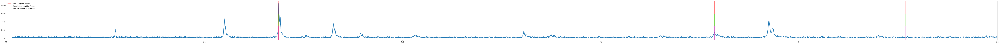

R040002 1
hexagonal
<gemmi.SpaceGroup("P 6/m c c")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.2122     9.2122     9.1893     1.57079633 1.57079633 2.0943951 ]


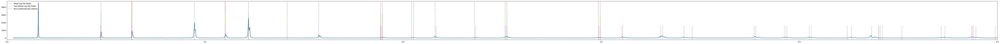

R040003 2
tetragonal
<gemmi.SpaceGroup("P -4 21 m")>
Unit cell BL consistent: False
Consistent diffraction: False
[9.5275     9.6432     6.5115     1.57079633 1.57079633 1.57079633]

R040004 3
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.9543     8.4739     5.3958     1.57079633 1.57079633 1.57079633]


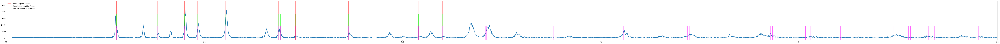

R040005 4
orthorhombic
<gemmi.SpaceGroup("P b n n")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 7.378      12.779      10.096       1.57079633  1.57079633  1.57079633]

R040006 5
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.6974     7.7199     6.9758     1.58728969 2.05536954 1.59533566]


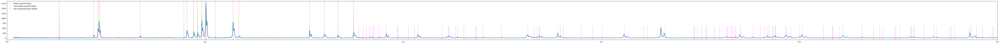

R040007 6
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.8693     8.3583     5.351      1.57079633 1.57079633 1.57079633]


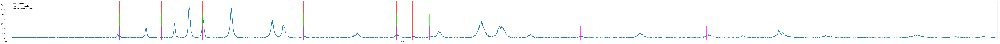

R040008 7
[[15.4141      7.317       7.0649      1.66485212]]
monoclinic
<gemmi.SpaceGroup("P 1 21/a 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[15.4141      7.317       7.0649      1.57079633  1.66485212  1.57079633]


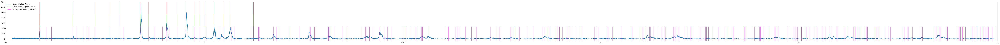

R040009 8
[[9.7481     8.923      5.2508     1.84805933]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.7481     8.923      5.2508     1.57079633 1.84805933 1.57079633]


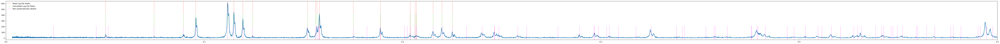

R040010 9
[[ 9.9293     18.128       5.3364      1.83512644]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.9293     18.128       5.3364      1.57079633  1.83512644  1.57079633]


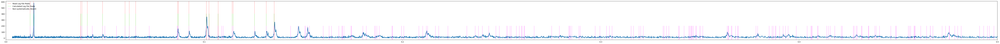

R040011 10
[[ 4.5443      5.0143     17.6107      1.58390375]]
monoclinic
<gemmi.SpaceGroup("P 1 21/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 4.5443      5.0143     17.6107      1.57079633  1.58390375  1.57079633]


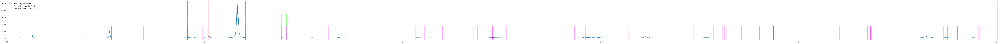

R040012 11
orthorhombic
<gemmi.SpaceGroup("A m m a")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.004      6.993      6.2405     1.57079633 1.57079633 1.57079633]


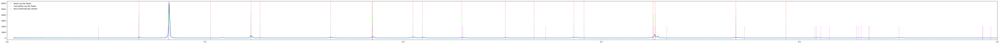

R040013 12
orthorhombic
<gemmi.SpaceGroup("P n a m")>
Unit cell BL consistent: True
Consistent diffraction: True
[8.0432     8.7644     7.739      1.57079633 1.57079633 1.57079633]


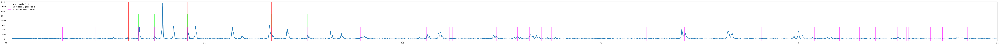

R040014 13
triclinic
<gemmi.SpaceGroup("I -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.844      10.755       7.128       1.73799887  1.74114046  1.46394727]


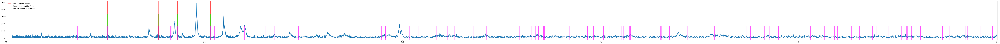

R040016 14
[[ 4.737      10.2789      7.8481      1.57079633]]
R040017 15
tetragonal
<gemmi.SpaceGroup("P 42/m n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.7374     4.7374     3.1864     1.57079633 1.57079633 1.57079633]


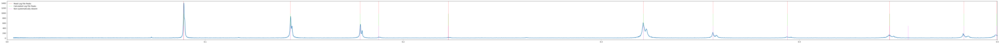

R040018 16
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 4.7617     10.2255      5.9927      1.57079633  1.57079633  1.57079633]


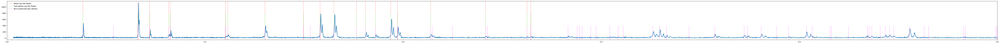

R040019 17
[[ 9.8859     18.0004      5.2731      1.82601582]]
monoclinic
<gemmi.SpaceGroup("I 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.8859     18.0004      5.2731      1.57079633  1.82601582  1.57079633]


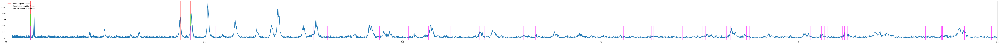

R040020 18
[[14.7472     13.066       7.5574      1.95546689]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[14.7472     13.066       7.5574      1.57079633  1.95546689  1.57079633]


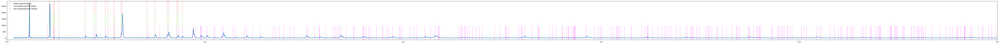

R040021 19
[[17.742      17.852       7.4293      2.03261045]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[17.742      17.852       7.4293      1.57079633  2.03261045  1.57079633]


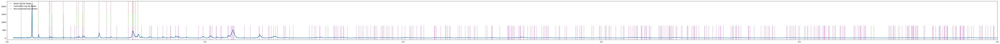

R040022 20
orthorhombic
<gemmi.SpaceGroup("F d d 2")>
Unit cell BL consistent: True
Consistent diffraction: True
[18.2955     18.6353      6.5813      1.57079633  1.57079633  1.57079633]


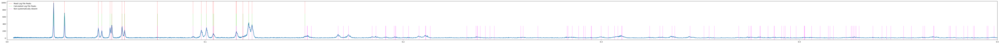

R040023 21
R040024 22
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.42484302 5.42484302 5.42484302 0.96472898 0.96472898 0.96472898]


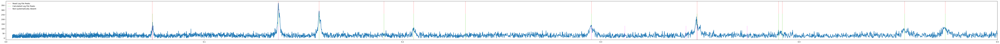

R040025 23
hexagonal
<gemmi.SpaceGroup("P 63")>
Unit cell BL consistent: True
Consistent diffraction: True
[10.0011     10.0011      8.3855      1.57079633  1.57079633  2.0943951 ]


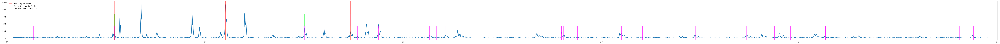

R040026 24
tetragonal
<gemmi.SpaceGroup("P -4 21 m")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.8277     7.8277     5.018      1.57079633 1.57079633 1.57079633]


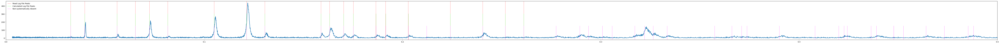

R040027 25
cubic
<gemmi.SpaceGroup("F d -3 m:1")>
Unit cell BL consistent: True
Consistent diffraction: True
[8.0988     8.0988     8.0988     1.57079633 1.57079633 1.57079633]


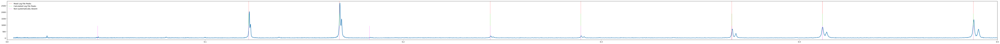

R040028 26
rhombohedral
<gemmi.SpaceGroup("R -3:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[8.80591375 8.80591375 8.80591375 1.94966758 1.94966758 1.94966758]


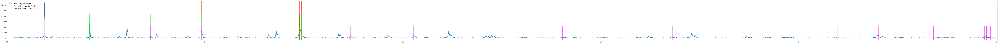

R040029 27
[[ 5.674      15.1049      6.4909      2.06844206]]
monoclinic
<gemmi.SpaceGroup("I 1 2/a 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 5.674      15.1049      6.4909      1.57079633  2.06844206  1.57079633]

R040030 28
rhombohedral
<gemmi.SpaceGroup("R -3:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.01515669 6.01515669 6.01515669 0.82226732 0.82226732 0.82226732]


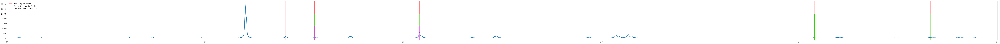

R040031 29
hexagonal
<gemmi.SpaceGroup("P 32 2 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.9134     4.9134     5.4042     1.57079633 1.57079633 2.0943951 ]


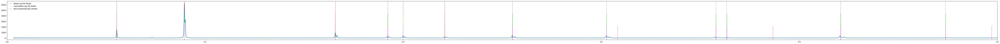

R040033 30
[[7.068      8.714      6.562      1.98653375]]
monoclinic
<gemmi.SpaceGroup("P 1 21/a 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[7.068      8.714      6.562      1.57079633 1.98653375 1.57079633]

R040034 31
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.77297759 5.77297759 5.77297759 0.83505438 0.83505438 0.83505438]


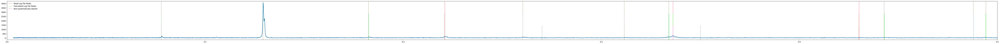

R040035 32
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.69888107 5.69888107 5.69888107 0.84227658 0.84227658 0.84227658]


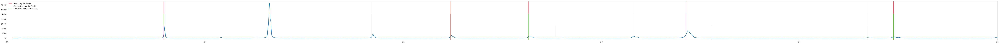

R040036 33
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.1549     8.8773     5.453      1.57079633 1.57079633 1.57079633]


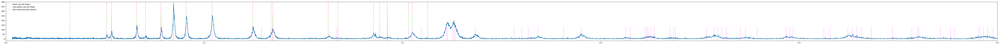

R040037 34
orthorhombic
<gemmi.SpaceGroup("P m c n")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.0928     8.3654     6.002      1.57079633 1.57079633 1.57079633]


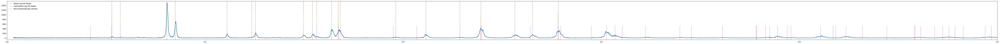

R040039 35
[[ 5.305       9.199      10.232       1.74585285]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 5.305       9.199      10.232       1.57079633  1.74585285  1.57079633]

R040040 36
orthorhombic
<gemmi.SpaceGroup("P m c n")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.3072     8.8928     6.4245     1.57079633 1.57079633 1.57079633]


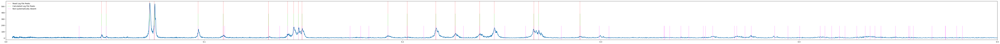

R040041 37
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.896      10.528      12.213       1.89787103  1.81426976  1.43169359]


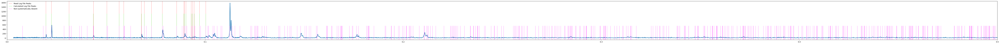

R040042 38
[[ 5.311049    9.1931     10.15028     1.74661905]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 5.311049    9.1931     10.15028     1.57079633  1.74661905  1.57079633]

R040043 39
R040044 40
[[4.73       5.703      4.952      1.57079633]]
monoclinic
<gemmi.SpaceGroup("P 1 2/c 1")>
Unit cell BL consistent: False
Consistent diffraction: False
[4.73       5.703      4.952      1.57079633 1.57079633 1.57079633]

R040045 41
[[ 9.86      18.118      5.285      1.8250908]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 9.86       18.118       5.285       1.57079633  1.8250908   1.57079633]

R040046 42
rhombohedral
<gemmi.SpaceGroup("R -3:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.70754698 7.70754698 7.70754698 1.88493948 1.88493948 1.88493948]


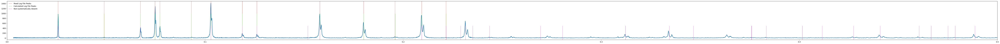

R040047 43
orthorhombic
<gemmi.SpaceGroup("P 2 c m")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 4.649       5.4888     18.582       1.57079633  1.57079633  1.57079633]


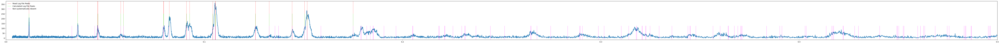

R040049 44
tetragonal
<gemmi.SpaceGroup("P 42/m n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.5955     4.5955     2.9598     1.57079633 1.57079633 1.57079633]


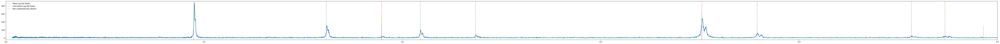

R040050 45
[[9.4638     8.3909     5.2178     1.92279433]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.4638     8.3909     5.2178     1.57079633 1.92279433 1.57079633]


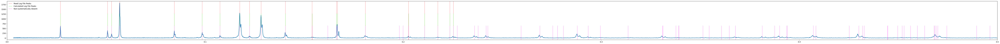

R040051 46
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.69266511 5.69266511 5.69266511 0.84260038 0.84260038 0.84260038]


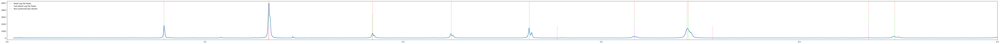

R040052 47
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 4.7558     10.1965      5.9817      1.57079633  1.57079633  1.57079633]


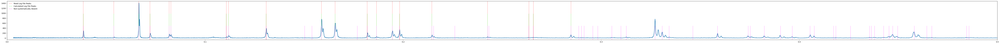

R040053 48
[[7.1217     7.4325     6.7958     1.78770585]]
monoclinic
<gemmi.SpaceGroup("P 1 21/n 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.1217     7.4325     6.7958     1.57079633 1.78770585 1.57079633]


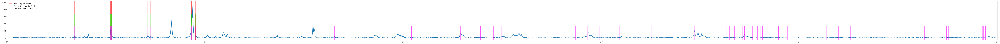

R040054 49
[[9.657      8.8002     5.302      1.87256375]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.657      8.8002     5.302      1.57079633 1.87256375 1.57079633]


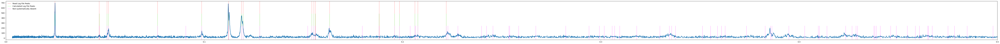

R040055 50
[[ 8.6        12.9978      7.2004      2.02543714]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.6        12.9978      7.2004      1.57079633  2.02543714  1.57079633]


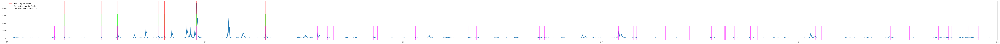

R040056 51
triclinic
<gemmi.SpaceGroup("P -1")>
Unit cell BL consistent: True
Consistent diffraction: False
[7.683      6.889      6.747      1.58004657 1.64270389 1.79332581]

R040057 52
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 4.7669     10.2453      6.0021      1.57079633  1.57079633  1.57079633]


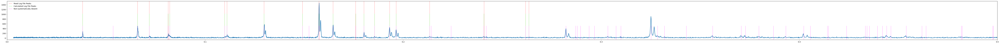

R040059 53
triclinic
<gemmi.SpaceGroup("I -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.182      12.8751     14.177       1.6268214   2.02178941  1.59174028]


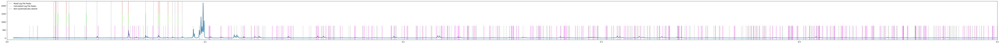

R040060 54
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.7105     7.7179     7.0047     1.59165301 2.05706251 1.59847725]


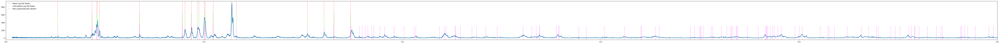

R040061 55
orthorhombic
<gemmi.SpaceGroup("A m m a")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.9984     6.9927     6.2383     1.57079633 1.57079633 1.57079633]


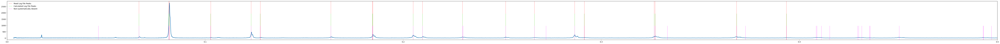

R040062 56
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.7076     7.7202     6.9946     1.58990768 2.05662618 1.59749986]


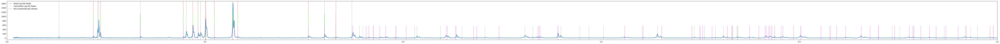

R040063 57
[[ 9.8387     18.0744      5.283       1.82749935]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.8387     18.0744      5.283       1.57079633  1.82749935  1.57079633]


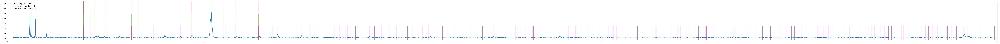

R040064 58
[[ 9.8429     18.0745      5.2829      1.82760407]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.8429     18.0745      5.2829      1.57079633  1.82760407  1.57079633]


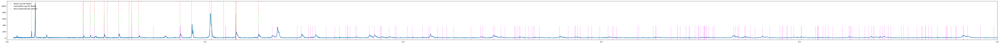

R040065 59
cubic
<gemmi.SpaceGroup("I a -3 d")>
Unit cell BL consistent: True
Consistent diffraction: True
[11.8517     11.8517     11.8517      1.57079633  1.57079633  1.57079633]


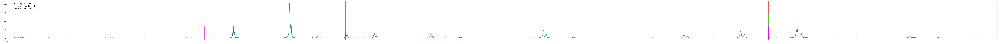

R040066 60
cubic
<gemmi.SpaceGroup("I a -3 d")>
Unit cell BL consistent: True
Consistent diffraction: True
[11.8665     11.8665     11.8665      1.57079633  1.57079633  1.57079633]


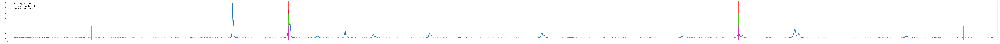

R040067 61
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.677      7.7199     6.9531     1.5839212  2.05304825 1.59226388]


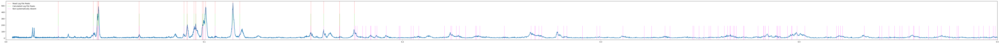

R040068 62
triclinic
<gemmi.SpaceGroup("C -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.135      12.784       7.1594      1.64533934  2.03494919  1.53095046]


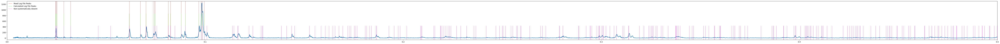

R040069 63
orthorhombic
<gemmi.SpaceGroup("P m c n")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.1824     8.4957     6.144      1.57079633 1.57079633 1.57079633]


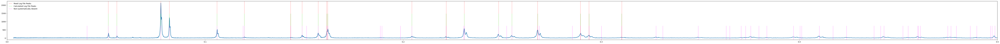

R040070 64
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.37090936 6.37090936 6.37090936 0.80426268 0.80426268 0.80426268]


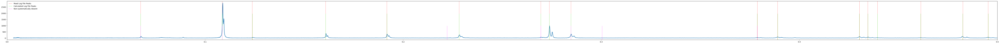

R040071 65
R040072 66
tetragonal
<gemmi.SpaceGroup("P 42/m n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.7376     4.7376     3.1865     1.57079633 1.57079633 1.57079633]


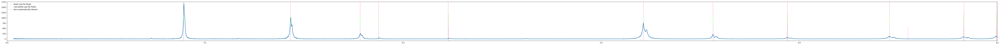

R040073 67
orthorhombic
<gemmi.SpaceGroup("P b n m")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.4286     9.4095     5.4789     1.57079633 1.57079633 1.57079633]


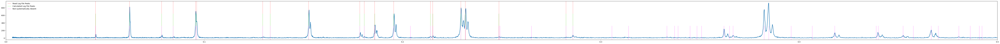

R040074 68
triclinic
<gemmi.SpaceGroup("P -1")>
Unit cell BL consistent: True
Consistent diffraction: True
[7.1484     9.182      8.964      1.60430665 1.71408786 1.34990746]


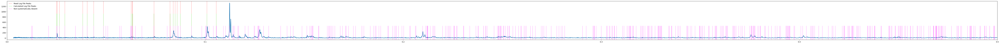

R040075 69
[[ 5.332       9.231      10.189       1.74759818]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 5.332       9.231      10.189       1.57079633  1.74759818  1.57079633]


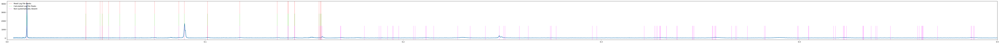

R040076 70
cubic
<gemmi.SpaceGroup("I a -3 d")>
Unit cell BL consistent: True
Consistent diffraction: True
[11.5389     11.5389     11.5389      1.57079633  1.57079633  1.57079633]


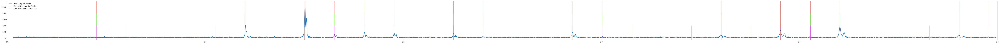

R040077 71
hexagonal
<gemmi.SpaceGroup("P -3 m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[3.1467     3.1467     4.7679     1.57079633 1.57079633 2.0943951 ]


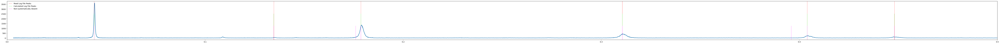

R040078 72
orthorhombic
<gemmi.SpaceGroup("P m c n")>
Unit cell BL consistent: True
Consistent diffraction: True
[4.9632     7.9673     5.7442     1.57079633 1.57079633 1.57079633]


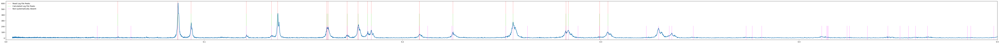

R040079 73
cubic
<gemmi.SpaceGroup("I a -3 d")>
Unit cell BL consistent: True
Consistent diffraction: True
[11.5379     11.5379     11.5379      1.57079633  1.57079633  1.57079633]


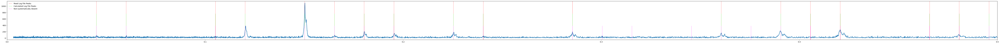

R040081 74
orthorhombic
<gemmi.SpaceGroup("C c c m")>
Unit cell BL consistent: True
Consistent diffraction: True
[17.0777      9.73        9.347       1.57079633  1.57079633  1.57079633]


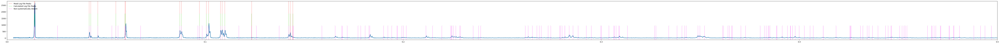

R040082 75
orthorhombic
<gemmi.SpaceGroup("C c c m")>
Unit cell BL consistent: True
Consistent diffraction: True
[17.0954      9.7354      9.3326      1.57079633  1.57079633  1.57079633]


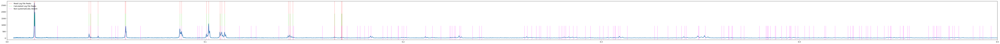

R040083 76
orthorhombic
<gemmi.SpaceGroup("P b c n")>
Unit cell BL consistent: True
Consistent diffraction: True
[14.317       5.7444      5.1089      1.57079633  1.57079633  1.57079633]


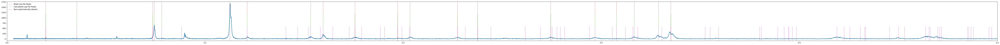

R040084 77
orthorhombic
<gemmi.SpaceGroup("C c c m")>
Unit cell BL consistent: True
Consistent diffraction: True
[17.0718      9.7227      9.344       1.57079633  1.57079633  1.57079633]


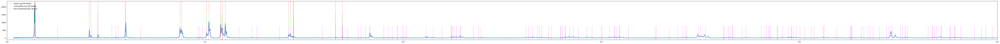

R040085 78
[[ 8.8783      5.6065     10.152       2.01494771]]
monoclinic
<gemmi.SpaceGroup("P 1 21/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.8783      5.6065     10.152       1.57079633  2.01494771  1.57079633]


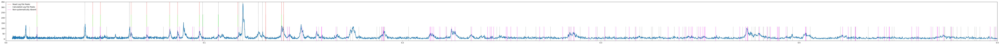

R040088 79
rhombohedral
<gemmi.SpaceGroup("R 3 m:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.50643361 9.50643361 9.50643361 1.98721857 1.98721857 1.98721857]


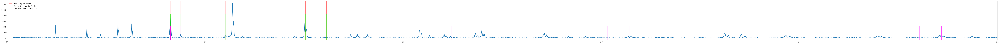

R040089 80
[[ 8.8881      5.6198     10.1564      2.01477318]]
monoclinic
<gemmi.SpaceGroup("P 1 21/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.8881      5.6198     10.1564      1.57079633  2.01477318  1.57079633]


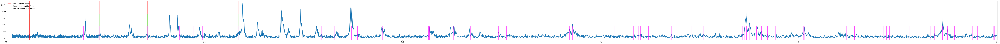

R040090 81
tetragonal
<gemmi.SpaceGroup("I 41/a m d:1")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.7518     5.7518     9.4076     1.57079633 1.57079633 1.57079633]


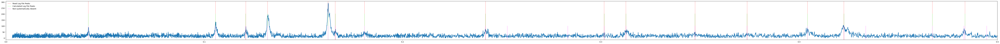

R040091 82
tetragonal
<gemmi.SpaceGroup("I 41/a m d:1")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.7619     5.7619     9.453      1.57079633 1.57079633 1.57079633]


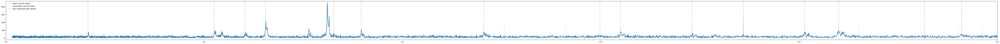

R040092 83
[[ 8.914       5.64       10.162       2.01410996]]
monoclinic
<gemmi.SpaceGroup("P 1 21/m 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 8.914       5.64       10.162       1.57079633  2.01410996  1.57079633]

R040093 84
orthorhombic
<gemmi.SpaceGroup("P b c a")>
Unit cell BL consistent: True
Consistent diffraction: True
[18.2566      8.8467      5.1917      1.57079633  1.57079633  1.57079633]


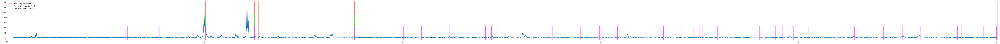

R040094 85
orthorhombic
<gemmi.SpaceGroup("P b c a")>
Unit cell BL consistent: True
Consistent diffraction: True
[18.2462      8.8429      5.1902      1.57079633  1.57079633  1.57079633]


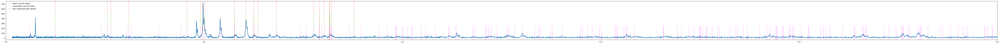

R040095 86
tetragonal
<gemmi.SpaceGroup("P 4/m n c")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 8.9722      8.9722     15.7928      1.57079633  1.57079633  1.57079633]


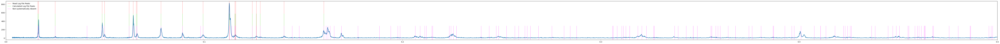

R040096 87
rhombohedral
<gemmi.SpaceGroup("R -3 c:H")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.12984883 5.12984883 5.12984883 0.96494484 0.96494484 0.96494484]


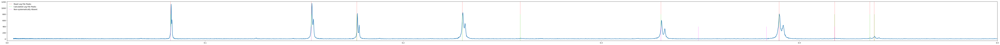

R040097 88
[[9.7503    8.8914    5.2734    1.8481466]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.7503     8.8914     5.2734     1.57079633 1.8481466  1.57079633]


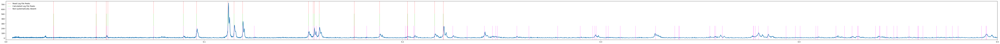

R040098 89
hexagonal
<gemmi.SpaceGroup("P 63/m")>
Unit cell BL consistent: True
Consistent diffraction: True
[9.3925     9.3925     6.8839     1.57079633 1.57079633 2.0943951 ]


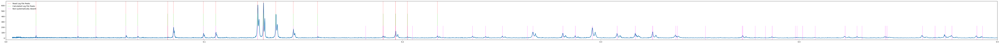

R040099 90
cubic
<gemmi.SpaceGroup("F m -3 m")>
Unit cell BL consistent: True
Consistent diffraction: True
[5.4639     5.4639     5.4639     1.57079633 1.57079633 1.57079633]


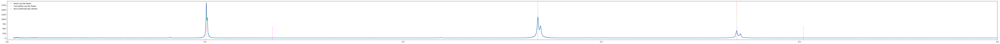

R040100 91
[[11.75        5.1395      7.625       1.97222205]]
monoclinic
<gemmi.SpaceGroup("P 1 2/a 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[11.75        5.1395      7.625       1.57079633  1.97222205  1.57079633]


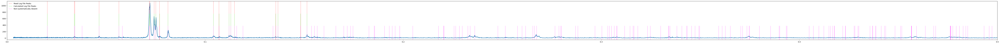

R040101 92
R040102 93
orthorhombic
<gemmi.SpaceGroup("F d d 2")>
Unit cell BL consistent: True
Consistent diffraction: True
[18.3084     18.6218      6.59        1.57079633  1.57079633  1.57079633]


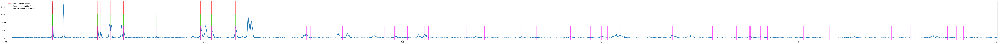

R040104 94
[[ 5.201       9.022      20.043       1.67167636]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 5.201       9.022      20.043       1.57079633  1.67167636  1.57079633]


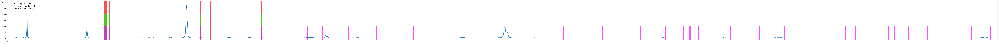

R040105 95
[[ 9.023       5.197      20.171       1.73625354]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: False
[ 9.023       5.197      20.171       1.57079633  1.73625354  1.57079633]

R040106 96
[[6.757     6.984     6.481     1.8107791]]
monoclinic
<gemmi.SpaceGroup("P 1 21/n 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[6.757      6.984      6.481      1.57079633 1.8107791  1.57079633]


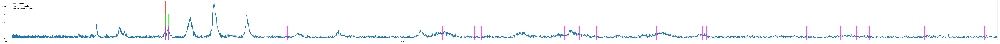

R040107 97
tetragonal
<gemmi.SpaceGroup("I 41/a:1")>
Unit cell BL consistent: True
Consistent diffraction: True
[13.0686     13.0686     13.758       1.57079633  1.57079633  1.57079633]


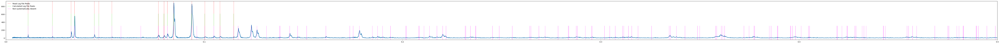

R040108 98
[[ 5.22        9.058      19.997       1.67185089]]
monoclinic
<gemmi.SpaceGroup("C 1 2/c 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 5.22        9.058      19.997       1.57079633  1.67185089  1.57079633]


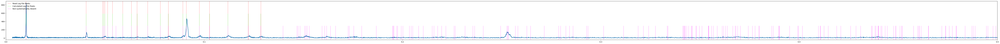

R040109 99
[[ 9.849     18.074      5.28       1.8283022]]
monoclinic
<gemmi.SpaceGroup("C 1 2/m 1")>
Unit cell BL consistent: True
Consistent diffraction: True
[ 9.849      18.074       5.28        1.57079633  1.8283022   1.57079633]


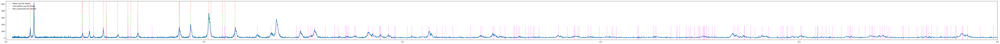

In [43]:
starting_index = 0
for sample_index, sample_name in enumerate(sample_names[0:]):
    print(f'{sample_name} {sample_index}')
    directory_name = os.path.join(RRUFF_directory, sample_name)
    dif_file_name = None
    processed_file_name = None
    for file_name in os.listdir(directory_name):
        if 'DIF_File' in file_name:
            dif_file_name = os.path.join(directory_name, file_name)
        elif 'Processed' in file_name:
            processed_file_name = os.path.join(directory_name, file_name)
    if dif_file_name and processed_file_name:
        unit_cell_degrees, spacegroup_symbol, wavelength, peaks = process_dif_file(dif_file_name)
        unit_cell = unit_cell_degrees.copy()
        unit_cell[3:] *= np.pi/180
        volume = get_unit_cell_volume(unit_cell_degrees)
        gemmi_spacegroup = gemmi.SpaceGroup(spacegroup_symbol)
        spacegroup_number = gemmi_spacegroup.number
        spacegroup_symbol_hm = gemmi_spacegroup.hm
        spacegroup_symbol_hall = gemmi_spacegroup.hall
        bravais_lattice, _, crystal_system, lattice_system = spacegroup_to_symmetry(spacegroup_number)
        crystal_system = gemmi_spacegroup.crystal_system_str()
        consistent_unit_cell = verify_unit_cell_consistency_by_bravais_lattice(
            bravais_lattice=bravais_lattice, unit_cell=unit_cell_degrees,
            )
        gemmi_cell = gemmi.UnitCell(*unit_cell_degrees)

        if lattice_system == 'cubic':
            uc = unit_cell[[0]][np.newaxis]
            reindexed_unit_cell = unit_cell
            reindexed_volume = volume
            reindexed_spacegroup_symbol_hm = spacegroup_symbol_hm
        elif lattice_system == 'hexagonal':
            uc = unit_cell[[0, 2]][np.newaxis]
            reindexed_unit_cell = unit_cell
            reindexed_volume = volume
            reindexed_spacegroup_symbol_hm = spacegroup_symbol_hm
        elif lattice_system == 'monoclinic':
            uc = unit_cell[[0, 1, 2, 4]][np.newaxis]
            print(uc)
            reindexed_unit_cell_degrees, reindexed_spacegroup_symbol_hm, _ = \
                reindex_entry_monoclinic(unit_cell_degrees, spacegroup_symbol_hm, radians=False)
            if reindexed_unit_cell_degrees is None:
                continue
            reindexed_unit_cell = reindexed_unit_cell_degrees.copy()
            reindexed_unit_cell[3:] *= np.pi/180
            reindexed_volume = get_unit_cell_volume(reindexed_unit_cell_degrees)
        elif lattice_system == 'orthorhombic':
            uc = unit_cell[[0, 1, 2]][np.newaxis]
            reindexed_spacegroup_symbol_hm, _, reindexed_unit_cell, _ = \
                reindex_entry_orthorhombic(unit_cell, gemmi_spacegroup.hm, gemmi_spacegroup.number)
            reindexed_volume = volume
        elif lattice_system == 'rhombohedral':
            if np.all(unit_cell_degrees[3:] == [90, 90, 120]):
                unit_cell_degrees, _ = hexagonal_to_rhombohedral_unit_cell(unit_cell_degrees, radians=False)
                unit_cell = unit_cell_degrees.copy()
                unit_cell[3:] *= np.pi/180
                uc = unit_cell[[0, 3]][np.newaxis]
                peaks[:, 3:] = hexagonal_to_rhombohedral_hkl(peaks[:, 3:])
                reindexed_unit_cell_degrees = unit_cell_degrees.copy()
            else:
                reindexed_unit_cell_degrees = unit_cell_degrees
            reindexed_unit_cell = reindexed_unit_cell_degrees.copy()
            reindexed_unit_cell[3:] *= np.pi/180
            reindexed_volume = get_unit_cell_volume(reindexed_unit_cell_degrees)
            reindexed_spacegroup_symbol_hm = spacegroup_symbol_hm
        elif lattice_system == 'tetragonal':
            uc = unit_cell[[0, 2]][np.newaxis]
            reindexed_unit_cell = unit_cell
            reindexed_volume = volume
            reindexed_spacegroup_symbol_hm = spacegroup_symbol_hm
        elif lattice_system == 'triclinic':
            uc = unit_cell[np.newaxis].copy()
            reindexed_unit_cell_degrees, _ = reindex_entry_triclinic(unit_cell_degrees, radians=False)
            reindexed_unit_cell = reindexed_unit_cell_degrees.copy()
            reindexed_unit_cell[3:] *= np.pi/180
            reindexed_volume = get_unit_cell_volume(reindexed_unit_cell_degrees)
            reindexed_spacegroup_symbol_hm = spacegroup_symbol_hm
        reindexed_spacegroup_symbol_hall = gemmi.SpaceGroup(reindexed_spacegroup_symbol_hm).hall

        pattern = np.loadtxt(processed_file_name, comments='#', delimiter=',')
        resolution = wavelength / (2 * np.sin(pattern[:, 0] / 2 * np.pi/180))
        q2_pattern = 1 / resolution**2
        I = pattern[:, 1]
        
        d_spacing = wavelength / (2 * np.sin(peaks[:, 0] / 2 * np.pi/180))
        q2_peaks = 1 / d_spacing**2

        hkl_sa = gemmi.make_miller_array(gemmi_cell, gemmi_spacegroup, 0.95*d_spacing[-1], 100, True)

        q2_calc = Q2Calculator(
            lattice_system=lattice_system,
            hkl=peaks[:, 3:],
            tensorflow=False,
            representation='unit_cell',
            ).get_q2(uc)[0]

        q2_sa = Q2Calculator(
            lattice_system=lattice_system,
            hkl=hkl_sa,
            tensorflow=False,
            representation='unit_cell',
            ).get_q2(uc)[0]

        consistent_peaks = np.all(np.isclose(q2_calc, q2_peaks, atol=0.0001))
        print(lattice_system)
        print(gemmi_spacegroup)
        print(f'Unit cell BL consistent: {consistent_unit_cell}')
        print(f'Consistent diffraction: {consistent_peaks}')
        print(unit_cell)
        if not consistent_peaks:
            print()
            continue

        status = 'n'
        prominence = 0.1
        while status == 'n':
            found_indices, _ = scipy.signal.find_peaks(I, prominence=prominence*I.max())
            q2_found = q2_pattern[found_indices]
            fig, axes = plt.subplots(1, 1, figsize=(100, 4))
            axes.plot(q2_pattern, I, linewidth=2, zorder=1)
            ylim = axes.get_ylim()
            for index in range(q2_found.size):
                axes.plot(
                    [q2_found[index], q2_found[index]], [ylim[0], ylim[1]],
                    color=0.1*np.ones(3), linewidth=1, zorder=2,
                    )
                axes.annotate(f'{index}', xy=(q2_found[index], 0.8*ylim[1]), fontsize=15)
            axes.set_ylim()
            plt.show()
            status = input('Good Prominence: y/n')
            if status != 'n':
                selected_indices = [int(p) for p in input('Select Peaks').split(',')]
                print(selected_indices)
                q2_found = q2_found[selected_indices]
            else:
                print(f'Current Prominence: {prominence}')
                prominence = float(input('Provide Prominence'))

        fig, axes = plt.subplots(1, 1, figsize=(100, 4))
        axes.plot(q2_pattern, I, linewidth=2, zorder=1)
        ylim = axes.get_ylim()
        n_peaks = min(peaks.shape[0], 20)
        for index in range(n_peaks):
            if index == 0:
                label0 = 'Read Log File Peaks'
                label1 = 'Calculated Log File Peaks'
            else:
                label0 = None
                label1 = None
            axes.plot(
                [q2_peaks[index], q2_peaks[index]], ylim,
                color=[1, 0, 0], linewidth=0.5, zorder=2,
                label=label0
                )
            axes.plot(
                [q2_calc[index], q2_calc[index]], [ylim[0], 0.66*ylim[1]],
                color=[0, 1, 0], linewidth=0.5, zorder=2,
                label=label1
                )
        for index in range(q2_sa.size):
            if index == 0:
                label = 'Non-systematically Absent'
            else:
                label = None
            axes.plot(
                [q2_sa[index], q2_sa[index]], [ylim[0], 0.33*ylim[1]],
                color=[1, 0, 1], linewidth=0.5, zorder=2,
                label=label,
                )

        for index in range(q2_found.size):
            if index == 0:
                label = 'Found Peaks'
            else:
                label = None
            axes.plot(
                [q2_found[index], q2_found[index]], [ylim[0], 0.2*ylim[1]],
                color=0.1*np.ones(3), linewidth=1, zorder=2,
                label=label,
                )
        axes.set_ylim(ylim)
        axes.set_xlim([0, 0.5])
        axes.legend(frameon=False, loc='upper left')
        plt.show()

        info = {
            'name': sample_name,
            'wavelength': wavelength,
            'spacegroup_number': spacegroup_number,
            'bravais_lattice': bravais_lattice,
            'crystal_system': crystal_system,
            'lattice_system': lattice_system,
            'unit_cell': unit_cell,
            'volume': volume,
            'spacegroup_symbol_hall': spacegroup_symbol_hall,
            'spacegroup_symbol_hm': spacegroup_symbol_hm,
            'reindexed_spacegroup_symbol_hall':reindexed_spacegroup_symbol_hall,
            'reindexed_spacegroup_symbol_hm': reindexed_spacegroup_symbol_hm,
            'reindexed_unit_cell': reindexed_unit_cell,
            'reindexed_volume': reindexed_volume,
            'pattern': I,
            'q2_pattern': q2_pattern,
            'q2_found': q2_found,
            'q2_log': q2_peaks,
            }
        pd.Series(info).to_json(os.path.join(directory_name, f'{sample_name}_extracted_info.json'))


In [37]:
pd.DataFrame?

Init signature:
pd.DataFrame(
    data=None,
    index: 'Axes | None' = None,
    columns: 'Axes | None' = None,
    dtype: 'Dtype | None' = None,
    copy: 'bool | None' = None,
) -> 'None'
Docstring:     
Two-dimensional, size-mutable, potentially heterogeneous tabular data.

Data structure also contains labeled axes (rows and columns).
Arithmetic operations align on both row and column labels. Can be
thought of as a dict-like container for Series objects. The primary
pandas data structure.

Parameters
----------
data : ndarray (structured or homogeneous), Iterable, dict, or DataFrame
    Dict can contain Series, arrays, constants, dataclass or list-like objects. If
    data is a dict, column order follows insertion-order. If a dict contains Series
    which have an index defined, it is aligned by its index. This alignment also
    occurs if data is a Series or a DataFrame itself. Alignment is done on
    Series/DataFrame inputs.

    If data is a list of dicts, column order follows 